# *Lens Comparison*

This tutorial explores the differences between a `refractive lens` and a `cosine-squared lens`.  
The goal is to analyze how each lens affects light propagation and compare their optical performance.

In [1]:
cd ../..

/home/gusah7787/project/pado-internal


/home/gusah7787/.pyenv/versions/3.9.21/envs/padoenv/lib/python3.9/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


## 🌊 **Step 1: Import Pado**
First, you should import `Pado`. Make sure to install all the dependency.

In [2]:
import pado
from pado.math import nm, um, mm, m

import torch
import numpy as np
from matplotlib import pyplot as plt

In [3]:
R, C = 1024, 1024 # number of rows and cols
dim = (1, 1, R, C) 

wvl = 550 * nm # wavelength of the light
pitch = 2 * um # physical size of each pixel
device = 'cuda' if torch.cuda.is_available() else 'cpu'

propagator = pado.propagator.Propagator('ASM')

print(f'Device: {device}')

Device: cuda


The patterns used in the experiment are defined as shapes resembling the English alphabet `F`.

In [ ]:
def generate_f_tensor(n):
    """
    Generates a tensor with a 'F' shaped pattern in the center.
    
    Parameters:
    n (int): The size of the square tensor.
    
    Returns:
    torch.tensor: A tensor with a specific amplitude pattern.
    """

    amplitude = torch.zeros((n, n), device=device)
    center = n // 2 
    pattern_scale = n // 4
    amplitude[center-pattern_scale:center+pattern_scale, center-pattern_scale:center-pattern_scale//2] = 1.0
    amplitude[center-pattern_scale:center-pattern_scale//2, center-pattern_scale:center+pattern_scale] = 1.0
    amplitude[center-pattern_scale//4:center+pattern_scale//4, center-pattern_scale:center+pattern_scale//2] = 1.0

    return amplitude[None, None].to(device)

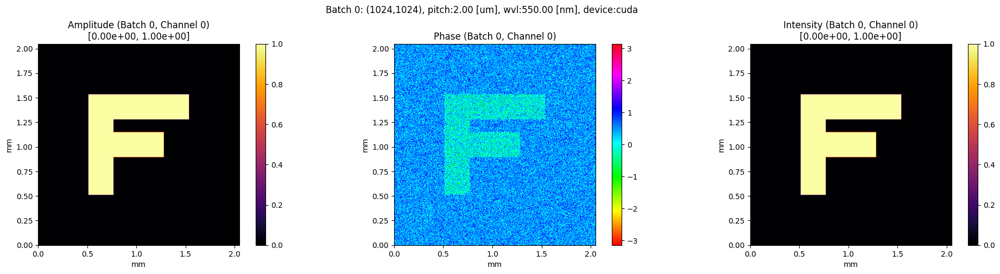

In [ ]:
# Generate a Tensor with 'F' shaped pattern 
object = generate_f_tensor(R)
object_light = pado.light.Light((1, 1, R, C), pitch, wvl, object, device=device)

# Define a light field
object_light.set_phase_random()
object_light.visualize()

We will analyze how each lens affects the propagation of light.  
To observe the progression of light, we will examine a cross-section in the yz-plane, following the sequential process from the `object plane`, through the `focal plane`, and finally to the `image plane` where the image is formed.

In [6]:
def simulate_diffraction(light, lens, object_distance, image_distance, N=400):
    """
    Simulates the diffraction pattern of light passing through a lens and aperture.
    
    Parameters:
    light (Light): Input light field.
    lens (OpticalElement): Lens applied to the light field.
    object_distance (float): Distance from the light source to the lens.
    image_distance (float): Distance from the lens to the final image plane.
    N (int, optional): Total number of simulation steps. Default is 400.
    
    Returns:
    np.ndarray: Log-scaled intensity profile of the propagated light field.
    """
    
    aperture = pado.optical_element.Aperture((1, 1, R, C), pitch, R * pitch, 'circle', wvl, device)
    ret = np.zeros((R, N))

    total_distance = object_distance + image_distance
    n = int(N * object_distance / total_distance)
    
    for i, z in enumerate(np.linspace(0, object_distance, n)):
        out = propagator.forward(light, z).get_intensity().cpu().squeeze()
        out = out[:, C // 2]
        ret[:, i] = out

    out_lens = propagator.forward(light, object_distance)
    out_lens = lens.forward(out_lens)
    out_lens = aperture.forward(out_lens)

    for i, z in enumerate(np.linspace(0, image_distance, N - n)):
        out = propagator.forward(out_lens, z).get_intensity().cpu().squeeze()
        out = out[:, C // 2]
        ret[:, i + n] = out

    ret[:, n] = 0
        
    return np.log(ret + 1e-9)

According to the `thin lens formula`, if the focal length is \( f \), the object distance is \( a \), and the image distance is \( b \), the following equation holds:

### $\frac{1}{f} = \frac{1}{a} + \frac{1}{b}$

In [7]:
def get_image_distance(object_distance, f):
    """
    Computes the image distance using the thin lens formula.

    Formula:
        1/f = 1/object_distance + 1/image_distance
        image_distance = 1 / (1/f - 1/object_distance)
    """
    return 1 / (1 / f - 1 / object_distance)

f = 0.1
object_distance = np.linspace(f * 1.2, f * 3, 100)

## 🔬 **Step 2: Simulating Refractive lens**

In this step, we will simulate the behavior of a `refractive lens`. The simulation will analyze how light propagates through the lens, focusing on refraction effects and image formation. By tracking the light rays as they pass through the lens, we can observe changes in direction and focal properties.

In [28]:
# define light field
sphere_wave = pado.light.Light(dim, pitch, wvl, field=torch.zeros(dim, device=device), device=device)
sphere_wave.field[..., R//2:R//2+1, C//2:C//2+1] = 1
plane_wave = pado.light.Light(dim, pitch, wvl, device=device)

f = 50 * mm # focal length
object_distance = f * 2 # object length
image_distance = get_image_distance(object_distance, f) #image length

print(f'object plane: {-object_distance}, focal plane: {f}, image plane: {image_distance}')

object plane: -0.1, focal plane: 0.05, image plane: 0.1


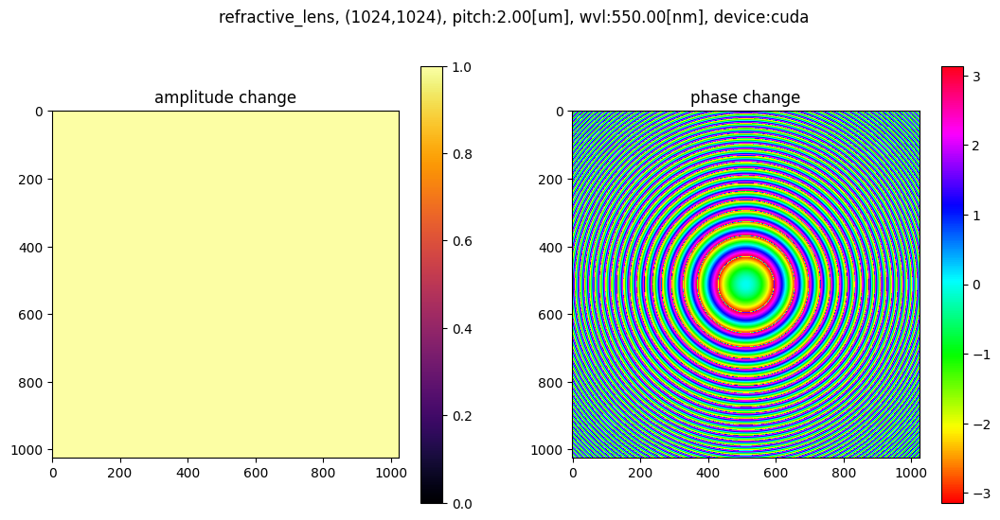

In [29]:
lens = pado.optical_element.RefractiveLens((1, 1, R, C), pitch, f, wvl, device)
lens.visualize()

We will examine how light propagates after passing through a lens in the case of both `plane waves` and `spherical waves`. This analysis will help us understand the focusing behavior and wavefront transformation induced by the lens.

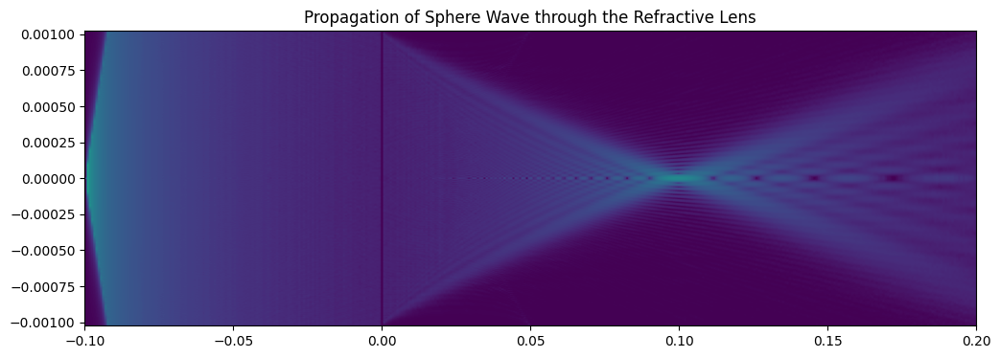

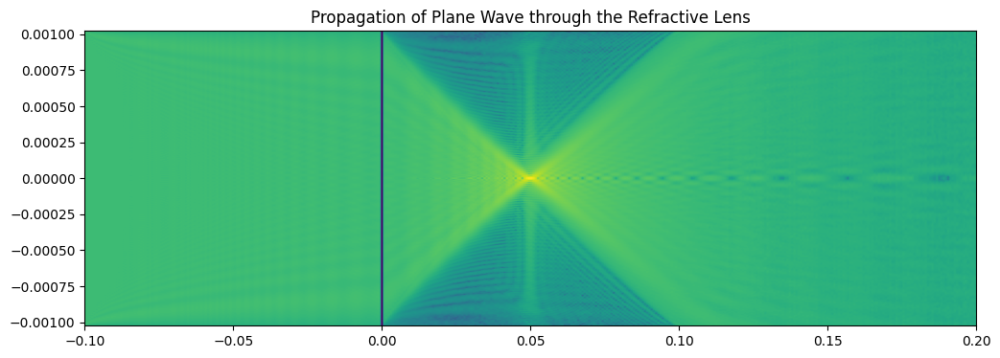

In [30]:
sphere_result = simulate_diffraction(sphere_wave, lens, object_distance, image_distance * 2)
plane_result = simulate_diffraction(plane_wave, lens, object_distance, image_distance * 2)

# Simulate the propgation of sphere wave
plt.figure(figsize=(12, 4))
plt.imshow((sphere_result), aspect='auto', extent=[-object_distance, image_distance * 2, -R * pitch / 2, R * pitch / 2])
plt.title('Propagation of Sphere Wave through the Refractive Lens') 

# Simulate the propgation of plane wave
plt.figure(figsize=(12, 4))
plt.imshow((plane_result), aspect='auto', extent=[-object_distance, image_distance * 2, -R * pitch / 2, R * pitch / 2])
plt.title('Propagation of Plane Wave through the Refractive Lens') 

plt.show()

Next, we will examine how an object appears at different observation distances after passing through a lens. It is particularly interesting to analyze the light field immediately after the lens, at the focal distance, and at the image distance to understand how the optical properties evolve through propagation.

In [11]:
def propagate_light(light, lens, object_distance, z):
    """
    Simulates light propagation through a lens system.

    Parameters:
    light (Light): The input light field.
    lens (OpticalElement): The lens optical element that modifies the wavefront.
    object_distance (float): The initial propagation distance from the light source to the lens.
    z (float): The final propagation distance after passing through the lens and aperture.
    """

    aperture = pado.optical_element.Aperture((1, 1, R, C), pitch, R * pitch, 'circle', wvl, device)
    out = propagator.forward(light, object_distance)
    out = lens.forward(out)
    out = aperture.forward(out)
    out = propagator.forward(out, z)

    return out

depth: 0.0


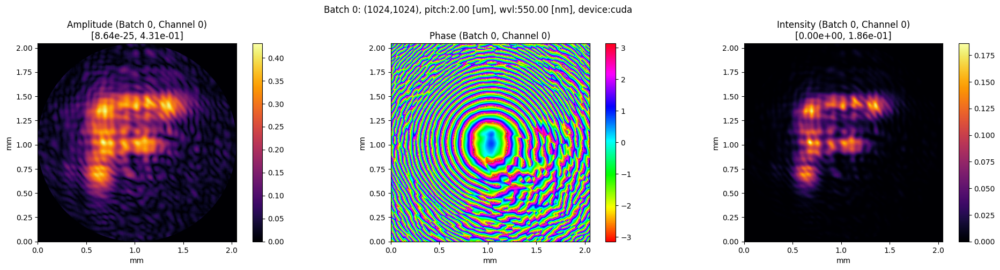

depth: 0.016666666666666666


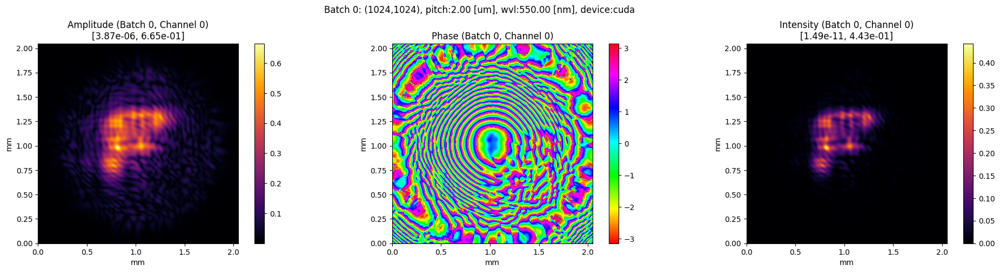

depth: 0.03333333333333333


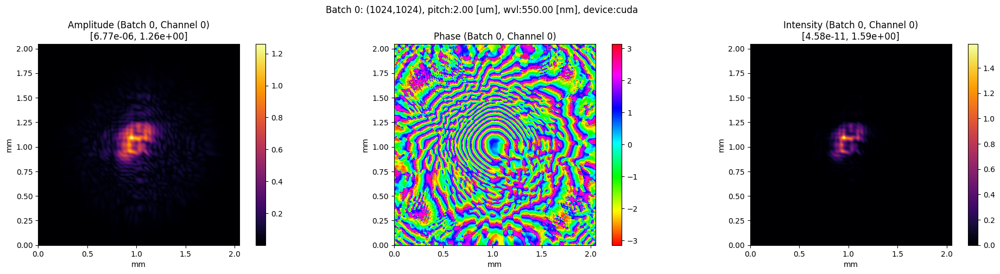

depth: 0.05 (focal plane)


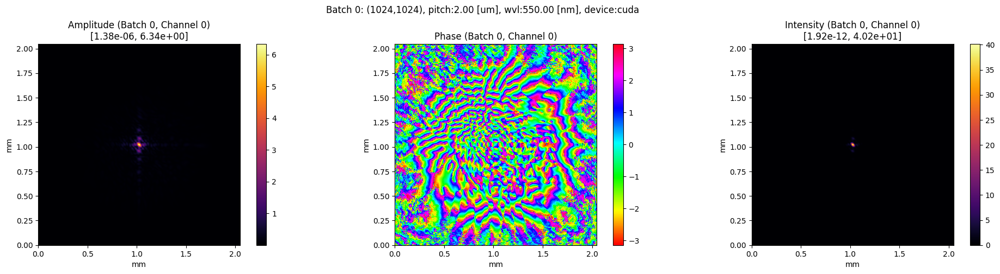

depth: 0.06666666666666667


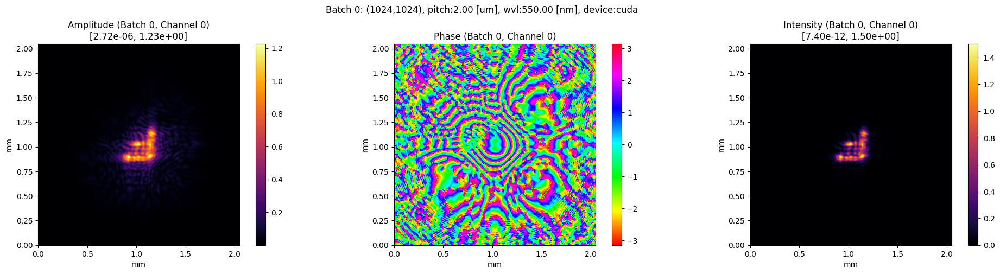

depth: 0.08333333333333333


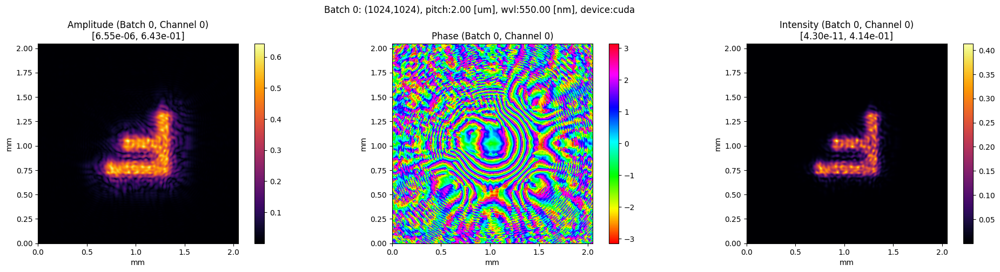

depth: 0.05 (image plane)


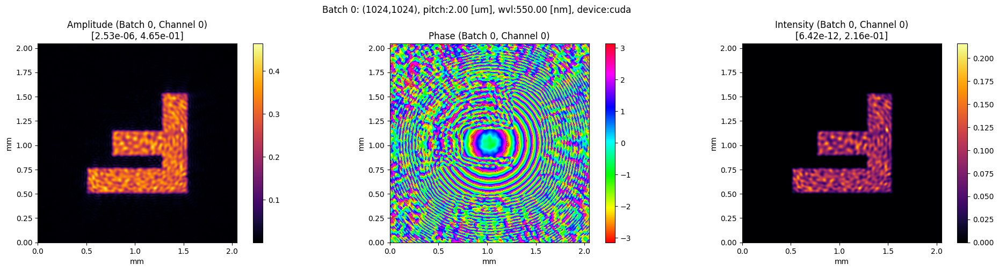

depth: 0.2


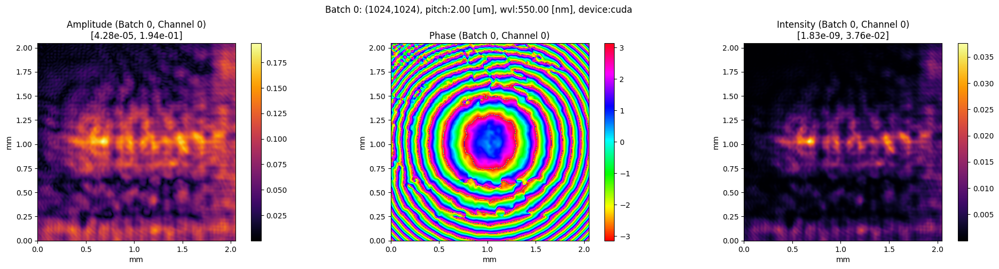

depth: 0.30000000000000004


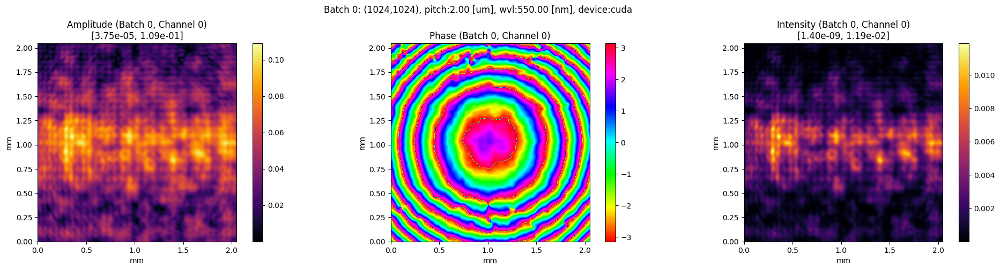

In [12]:
# From immediately after lens to focal plane
for z in np.arange(0, f, f / 3):
    print(f'depth: {z}')
    out = propagate_light(object_light, lens, object_distance, z)
    out.visualize()

# From focal plane to Image plane
for z in np.arange(f, image_distance, (image_distance - f) / 3):
    print(f'depth: {z}' if z != f else f'depth: {f} (focal plane)')
    out = propagate_light(object_light, lens, object_distance, z)
    out.visualize()

# From Image plane to infinity
for z in np.arange(image_distance, 3 * image_distance, image_distance):
    print(f'depth: {z}' if z != image_distance else f'depth: {f} (image plane)')
    out = propagate_light(object_light, lens, object_distance, z)
    out.visualize()

## ⚡️ **Step 3: Cosine Squared Lens**

In this step, we will simulate the behavior of a `cosine-squared lens`. This simulation will focus on how the lens modifies the wavefront and influences light propagation, analyzing the resulting intensity distribution and focal properties.

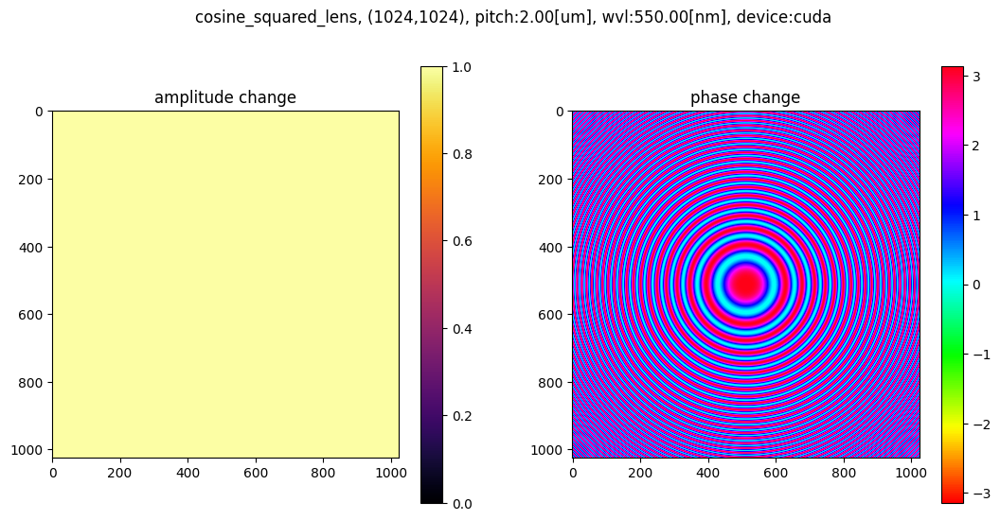

In [13]:
lens = pado.optical_element.CosineSquaredLens((1, 1, R, C), pitch, f, wvl, device)
lens.visualize()

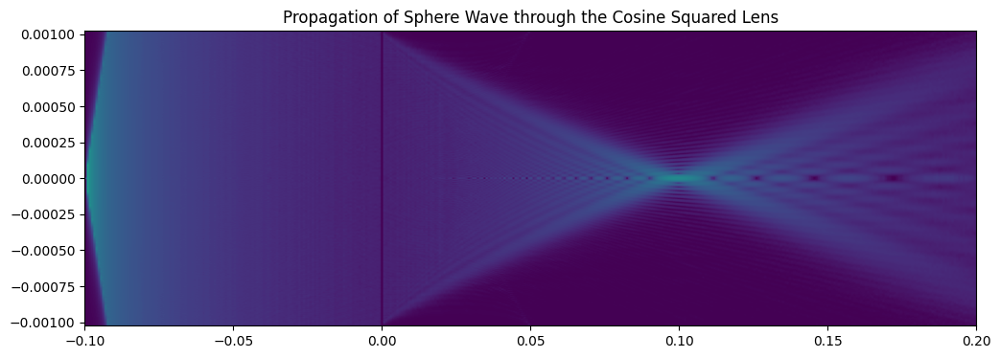

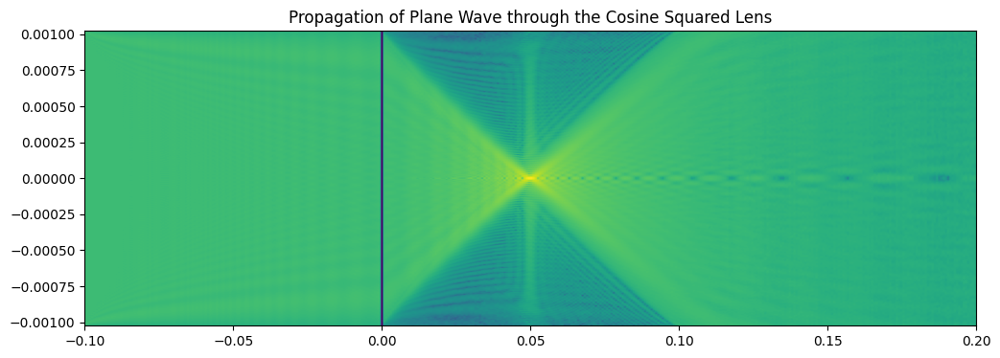

In [31]:
sphere_result = simulate_diffraction(sphere_wave, lens, object_distance, image_distance * 2)
plane_result = simulate_diffraction(plane_wave, lens, object_distance, image_distance * 2)

# Simulate the propgation of sphere wave
plt.figure(figsize=(12, 4))
plt.imshow((sphere_result), aspect='auto', extent=[-object_distance, image_distance * 2, -R * pitch / 2, R * pitch / 2])
plt.title('Propagation of Sphere Wave through the Cosine Squared Lens') 

# Simulate the propgation of plane wave
plt.figure(figsize=(12, 4))
plt.imshow((plane_result), aspect='auto', extent=[-object_distance, image_distance * 2, -R * pitch / 2, R * pitch / 2])
plt.title('Propagation of Plane Wave through the Cosine Squared Lens') 

plt.show()

depth: 0.0


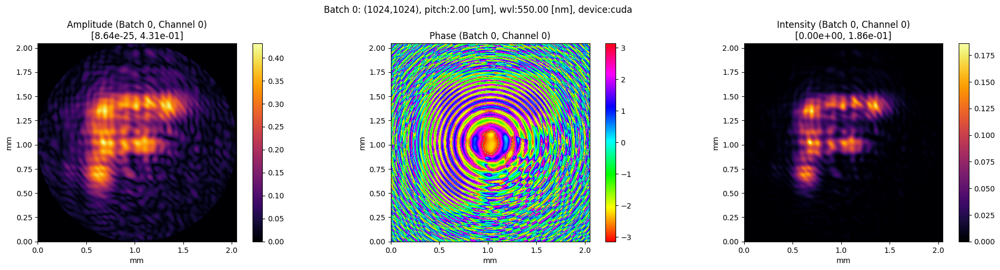

depth: 0.016666666666666666


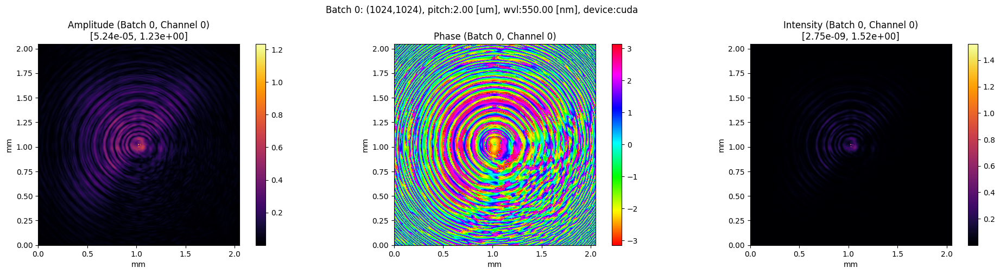

depth: 0.03333333333333333


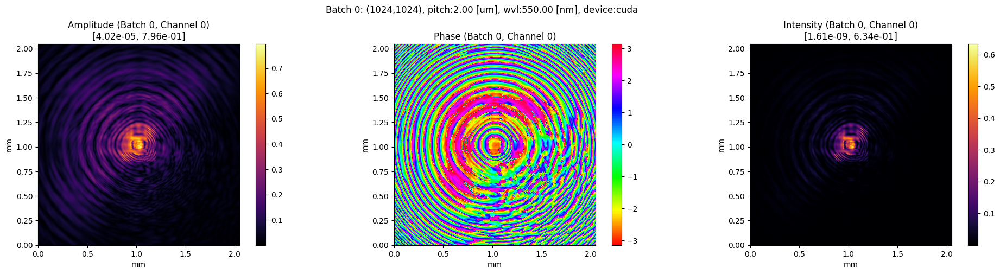

depth: 0.05 (focal plane)


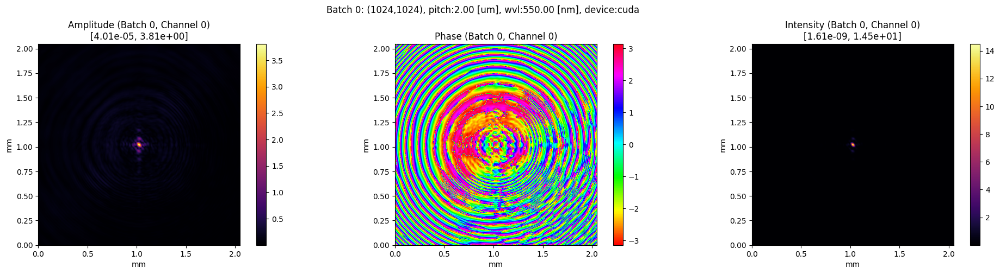

depth: 0.06666666666666667


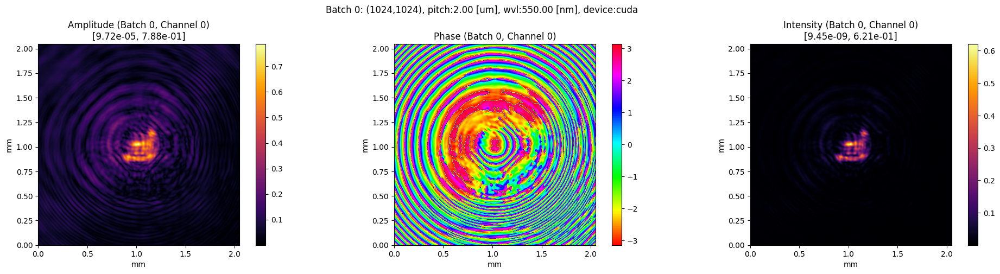

depth: 0.08333333333333333


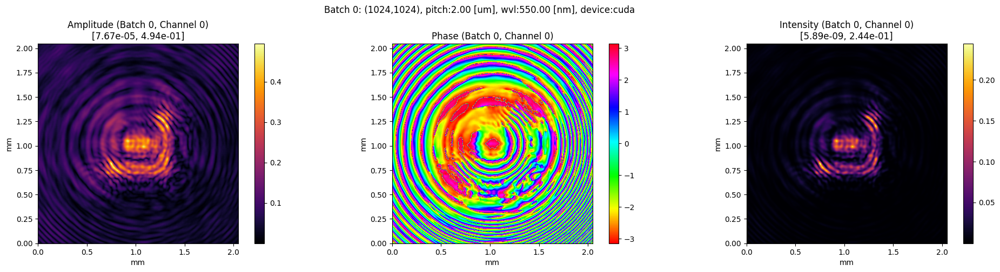

depth: 0.05 (image plane)


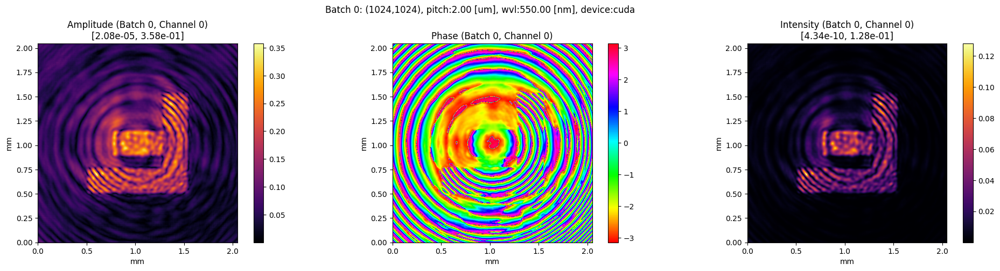

depth: 0.2


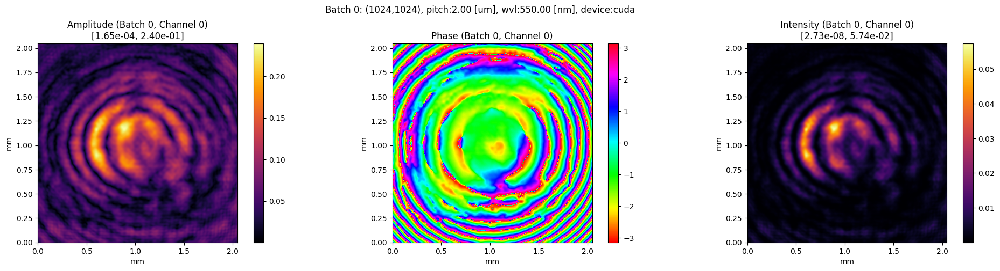

depth: 0.30000000000000004


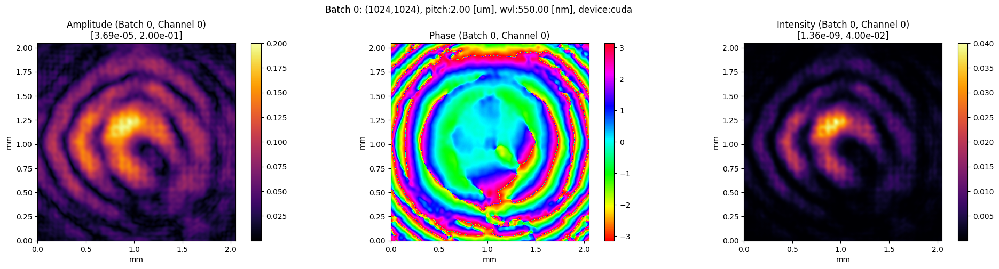

In [15]:
for z in np.arange(0, f, f / 3):
    print(f'depth: {z}')
    out = propagate_light(object_light, lens, object_distance, z)
    out.visualize()

for z in np.arange(f, image_distance, (image_distance - f) / 3):
    print(f'depth: {z}' if z != f else f'depth: {f} (focal plane)')
    out = propagate_light(object_light, lens, object_distance, z)
    out.visualize()

for z in np.arange(image_distance, 3 * image_distance, image_distance):
    print(f'depth: {z}' if z != image_distance else f'depth: {f} (image plane)')
    out = propagate_light(object_light, lens, object_distance, z)
    out.visualize()